# Open CV - Image Manipulations

In [ ]:
#importing all required libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [ ]:
input = cv2.imread('/content/1587051023975.jpg') # loading our image path

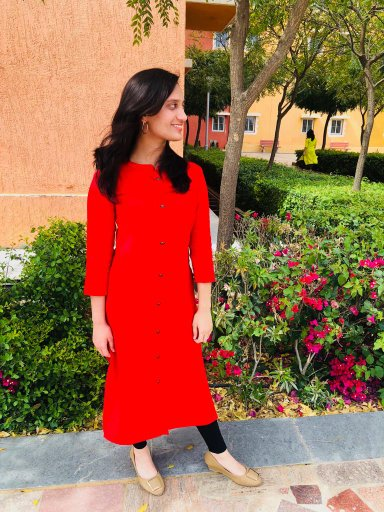

-1

In [ ]:
cv2_imshow(input)  # this function takes only 1 single parameter
cv2.waitKey(0)

In [ ]:
height, width = input.shape[:2]

quarter_h , quarter_w = height/4 , width/4
# T is our translation matrix
T = np.float32([[1,0,quarter_w], [0,1,quarter_h]])

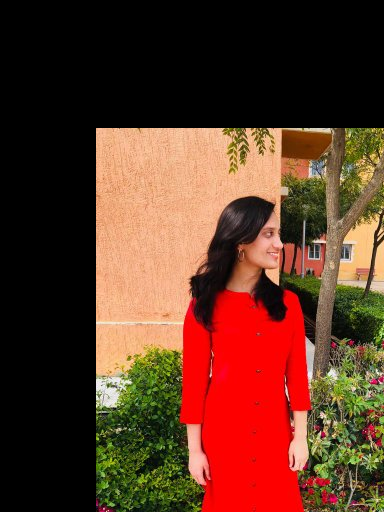

-1

In [ ]:
# we use warpAffine to transform the images using matrix, T
input_translated = cv2.warpAffine(input, T, (width,height))
cv2_imshow(input_translated) 
cv2.waitKey(0)

In [ ]:
print(T)

[[  1.   0.  96.]
 [  0.   1. 128.]]


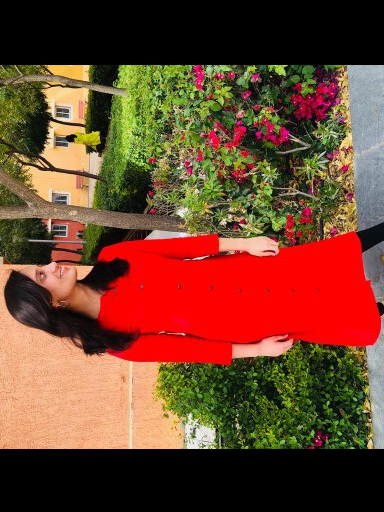

-1

In [ ]:
# Rotation of images
height, width = input.shape[:2]

rotation_matrix =cv2.getRotationMatrix2D((width/2 , height/2), 90, 1)
rotated_input =  cv2.warpAffine(input, rotation_matrix, (width,height))
cv2_imshow(rotated_input) 
cv2.waitKey(0)

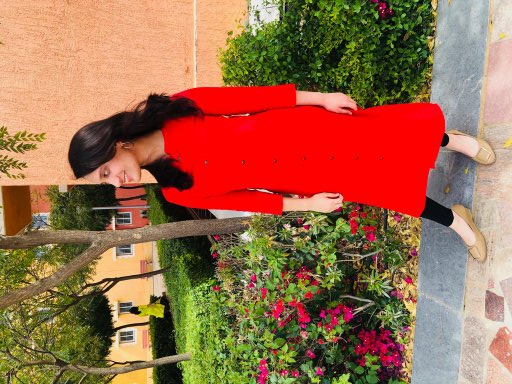

-1

In [ ]:
rotated_input = cv2.transpose(input)
cv2_imshow(rotated_input) 
cv2.waitKey(0)

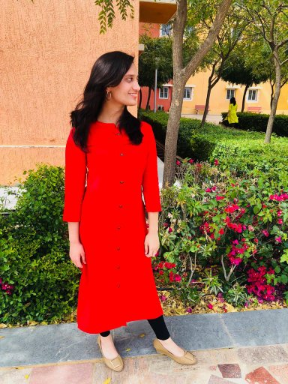

-1

In [ ]:
# Image scaling to 3/4 th its original size
scaled_input =cv2.resize(input, None, fx = 0.75, fy = 0.75)
cv2_imshow(scaled_input) 
cv2.waitKey(0)

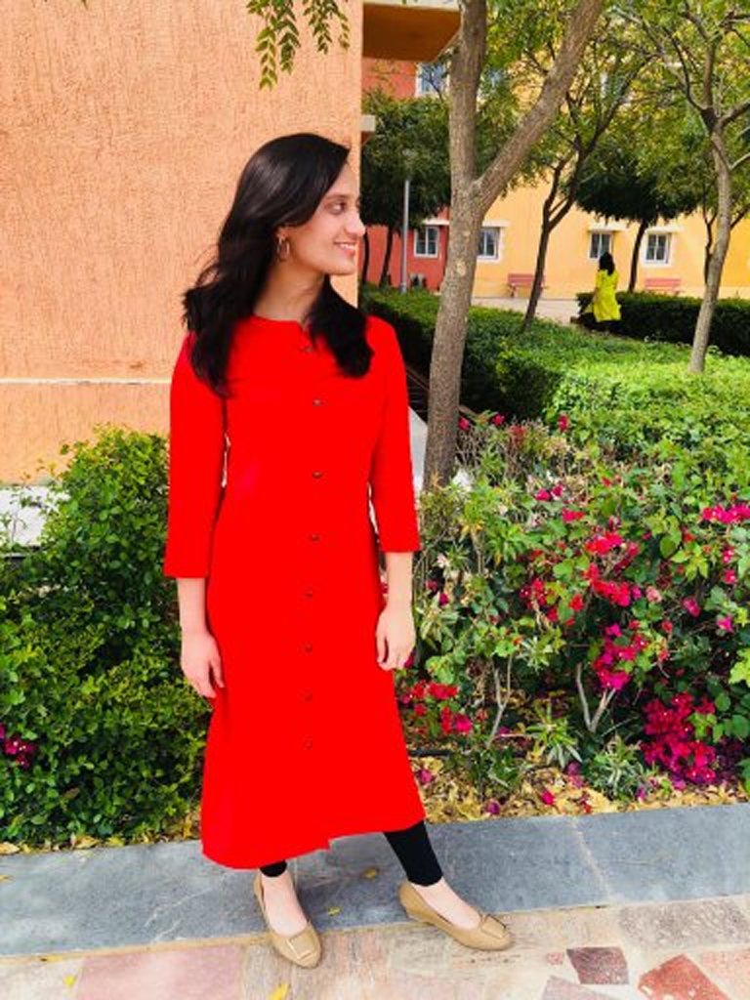

-1

In [ ]:
# Image scaling to double
scaled_input =cv2.resize(input, None, fx = 2, fy =2, interpolation = cv2.INTER_CUBIC)
cv2_imshow(scaled_input) 
cv2.waitKey(0)

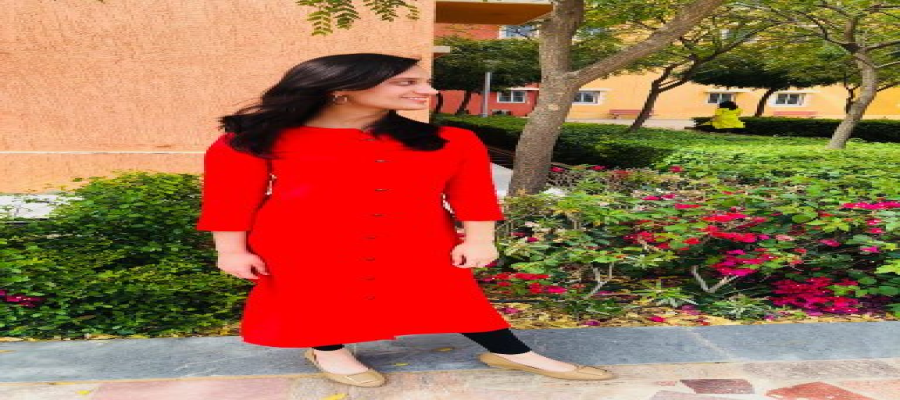

-1

In [ ]:
# Skewing the re-sizing by exact dimensions
scaled_input =cv2.resize(input, (900,400),interpolation = cv2.INTER_AREA)
cv2_imshow(scaled_input) 
cv2.waitKey(0)

## Image Pyramids -

useful for image detection

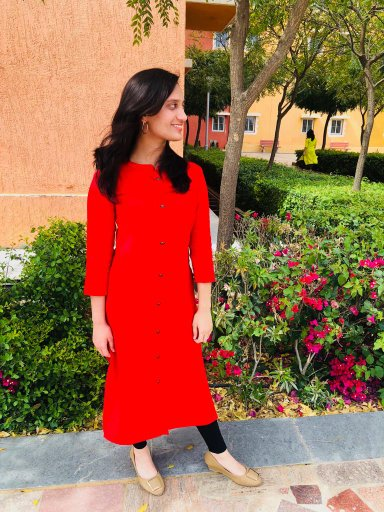

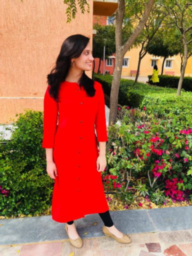

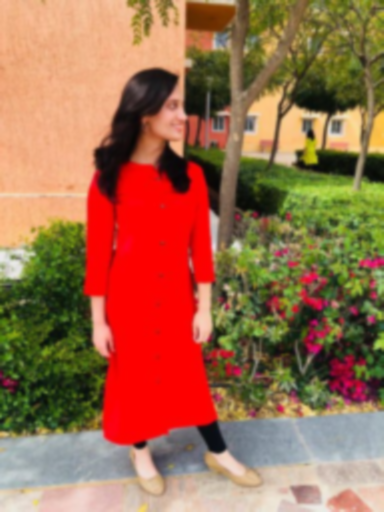

In [ ]:
smaller = cv2.pyrDown(input)
larger = cv2.pyrUp(smaller)
cv2_imshow(input) 
cv2_imshow(smaller) 
cv2_imshow(larger) 

## Cropping Images

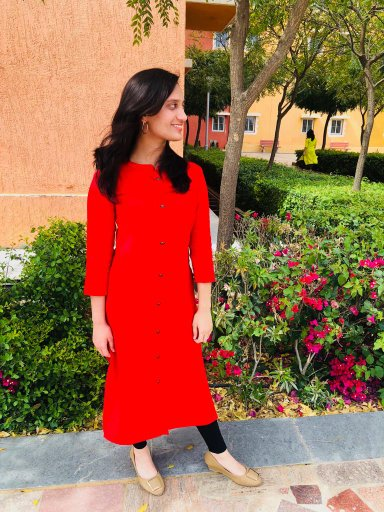

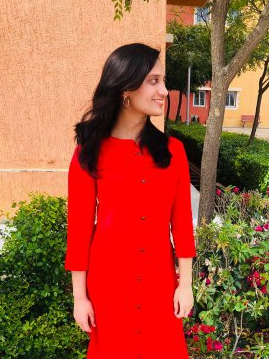

-1

In [ ]:
# getting starting pixel coordinates (top left of cropping rectangle)
start_r , start_c = int (height*.05), int (width*.05)

# getting the end point (bottom right)
end_r, end_c = int (height*.75), int (width*.75)

# using indexing to crop out the rectangle we desire
cropped = input[start_r:end_r, start_c:end_c]

cv2_imshow(input)
cv2.waitKey(0)

cv2_imshow(cropped)
cv2.waitKey(0)

##  Arithmetic Operations

They allow us to directly add or subtract  to the color intensity.

Calculates the pre-element operations of two arrays.The overall effect is increasing or decreasing brightness

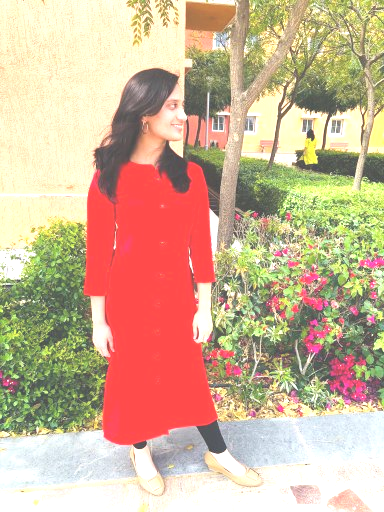

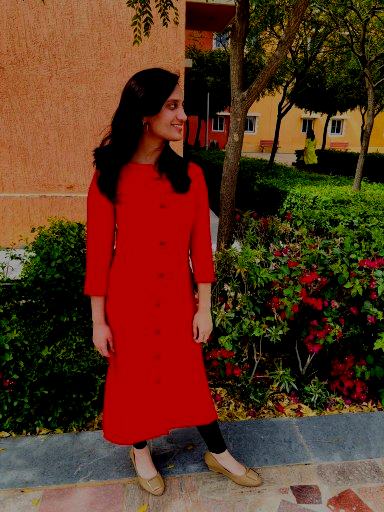

In [ ]:
M = np.ones(input.shape, dtype="uint8")* 75
added = cv2.add(input, M)
cv2_imshow(added)

subtracted = cv2.subtract(input, M)
cv2_imshow(subtracted)

## Bitwise Operations and Masking

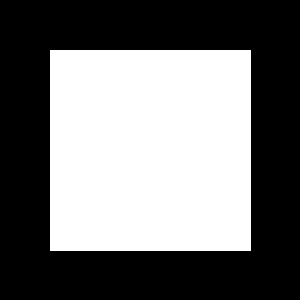

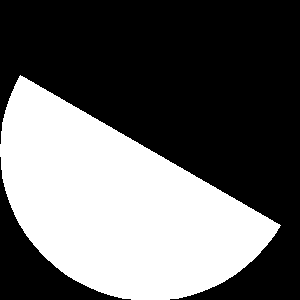

In [ ]:
# Making a square
square = np.zeros((300,300), np.uint8)
cv2.rectangle(square,(50,50),(250,250), 255, -2)
cv2_imshow(square)

# Making ellipse
ellipse = np.zeros((300,300), np.uint8)
cv2.ellipse(ellipse,(150,150),(150,150), 30,0, 180, 255, -1)
cv2_imshow(ellipse)

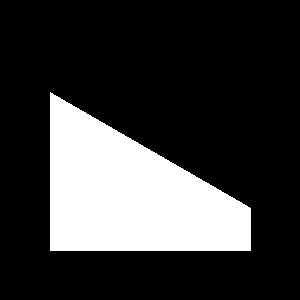

In [ ]:
# shows only where they intersect
AND = cv2.bitwise_and(square, ellipse)
cv2_imshow(AND)

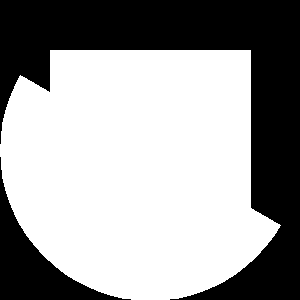

In [ ]:
# or case
AND = cv2.bitwise_or(square, ellipse)
cv2_imshow(AND)

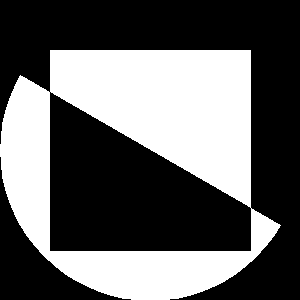

In [ ]:
# xor case
AND = cv2.bitwise_xor(square, ellipse)
cv2_imshow(AND)

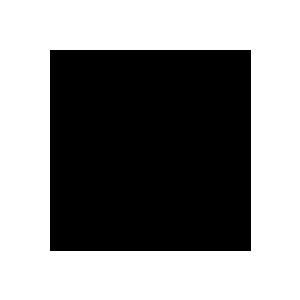

In [ ]:
#not
AND = cv2.bitwise_not(square, ellipse)
cv2_imshow(AND)

## Blurring of an image

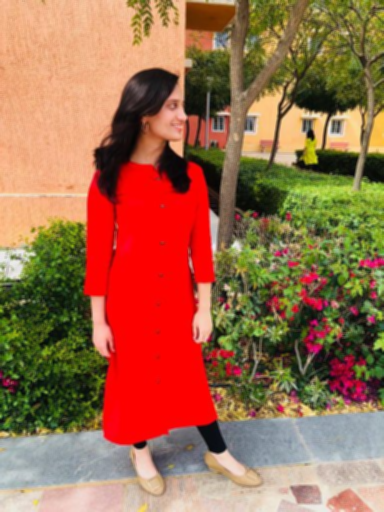

In [ ]:
kernel_3x3 = np.ones((3,3), np.float32)/9
blurred = cv2.filter2D(input, -1, kernel_3x3)
cv2_imshow(blurred)

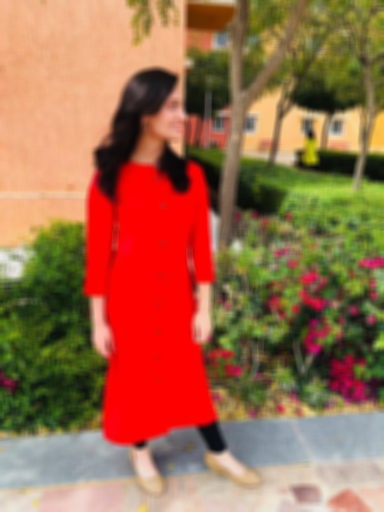

In [ ]:
kernel_7x7 = np.ones((7,7), np.float32)/49
blurred = cv2.filter2D(input, -1, kernel_7x7)
cv2_imshow(blurred)

### Other methods of blurring

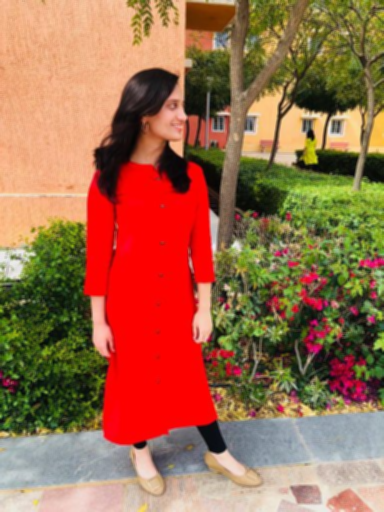

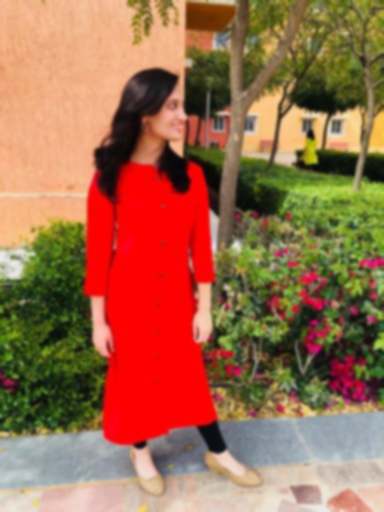

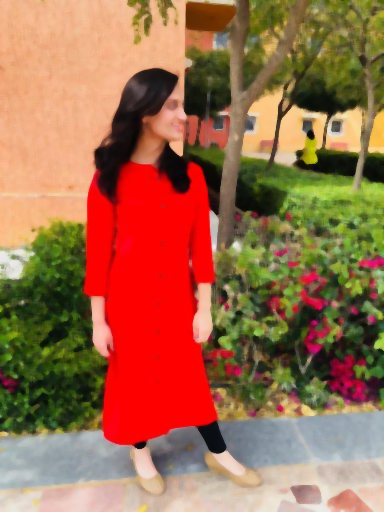

In [ ]:
blur = cv2.blur(input, (3,3))
cv2_imshow(blur)
Gaussian_blur = cv2.GaussianBlur(input,(7,7),0)
cv2_imshow(Gaussian_blur)
median_blur = cv2.medianBlur(input, 5)
cv2_imshow(median_blur)

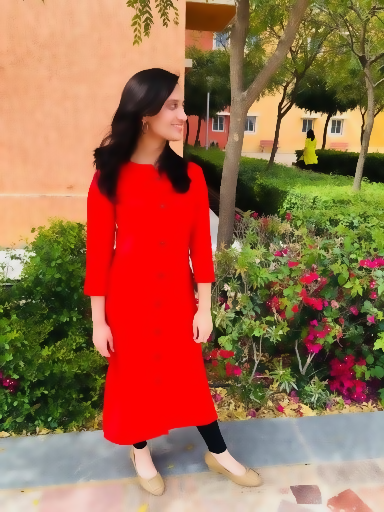

In [ ]:
# Bilateral is useful in noise removal while keeping  edges sharp
bilateral = cv2.bilateralFilter(input, 9 , 75,75)
cv2_imshow(bilateral)

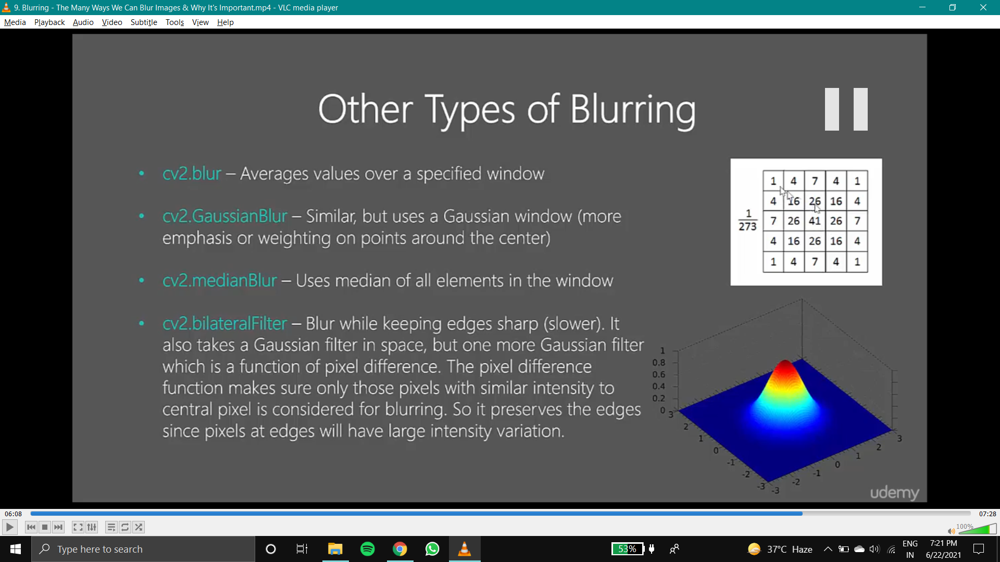

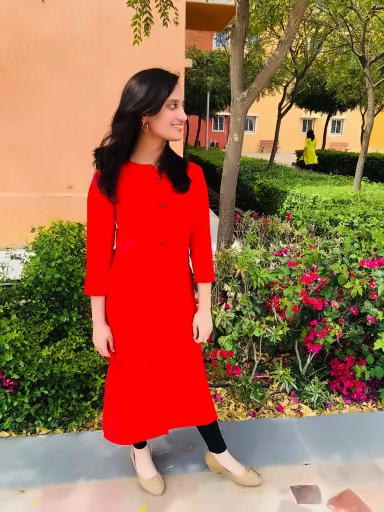

In [ ]:
dst = cv2.fastNlMeansDenoisingColored(input, None, 6,6,7,21)
cv2_imshow(dst)

## Sharpening of images

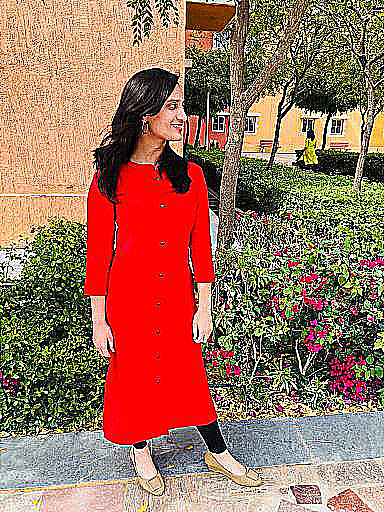

In [ ]:
kernel_sharpening = np.array([[-1,-1,-1],
                              [-1,9,-1],
                              [-1,-1,-1]])
sharpened =  cv2.filter2D(input, -1, kernel_sharpening)
cv2_imshow(sharpened)

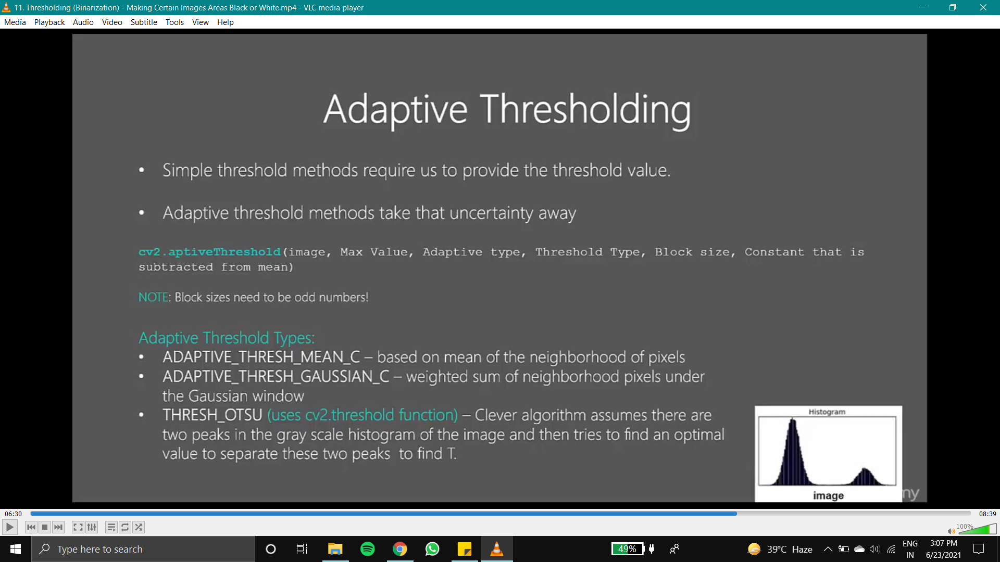

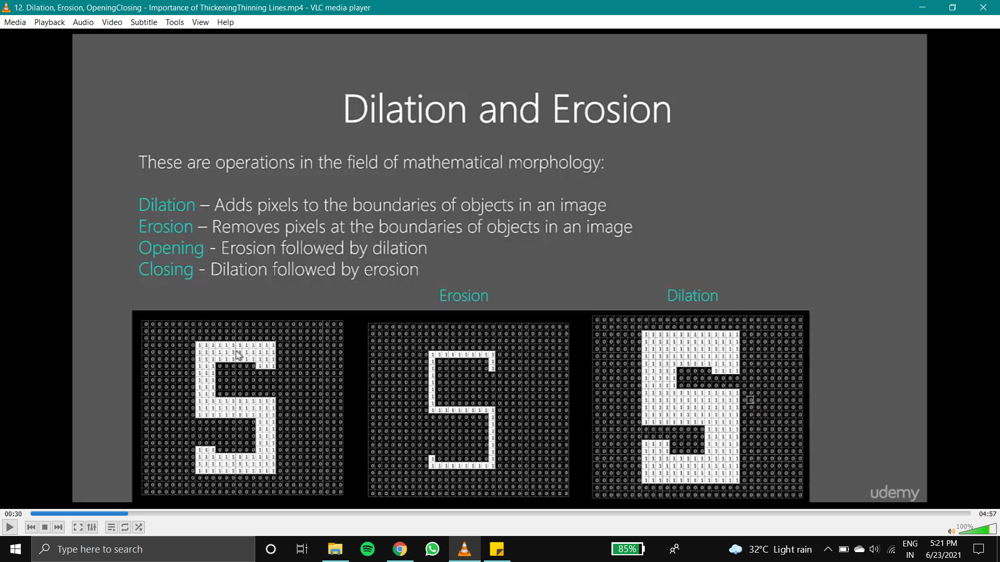

## Dilation and Erosian

In [ ]:
input = cv2.imread('/content/1587051023975.jpg',0)

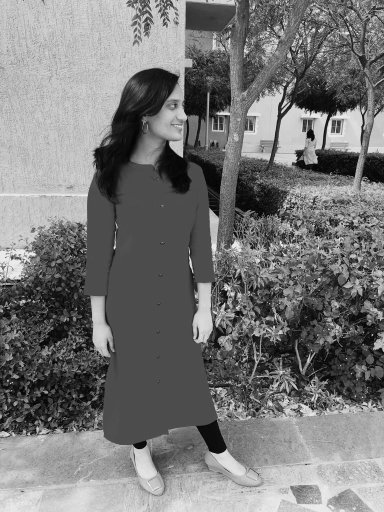

In [ ]:
cv2_imshow(input)

In [ ]:
kernel = np.ones((5,5), np.uint8)

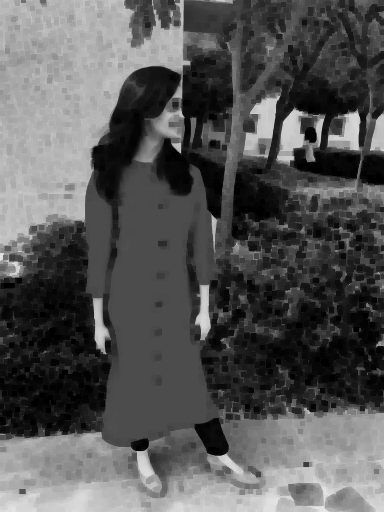

In [ ]:
#Erosion
erosion = cv2.erode(input,kernel,iterations=1)
cv2_imshow(erosion)

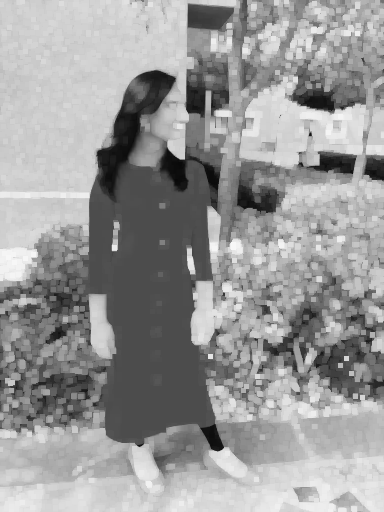

In [ ]:
#Dilation
dilation = cv2.dilate(input,kernel,iterations=1)
cv2_imshow(dilation)

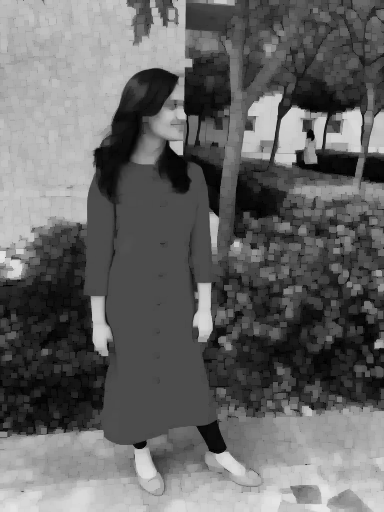

In [ ]:
#Opening - good for removing noise
opening = cv2.morphologyEx(input,cv2.MORPH_OPEN,kernel)
cv2_imshow(opening)

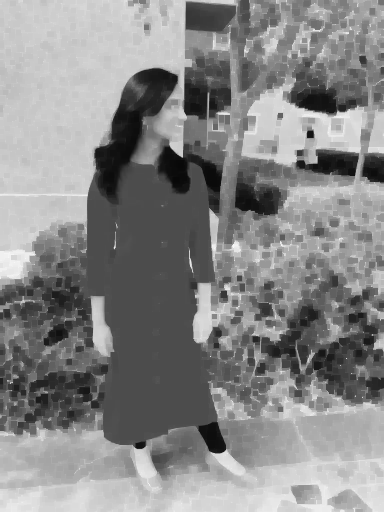

In [ ]:
closing = cv2.morphologyEx(input,cv2.MORPH_CLOSE,kernel)
cv2_imshow(closing)

## Edge Detection and Image Gradients

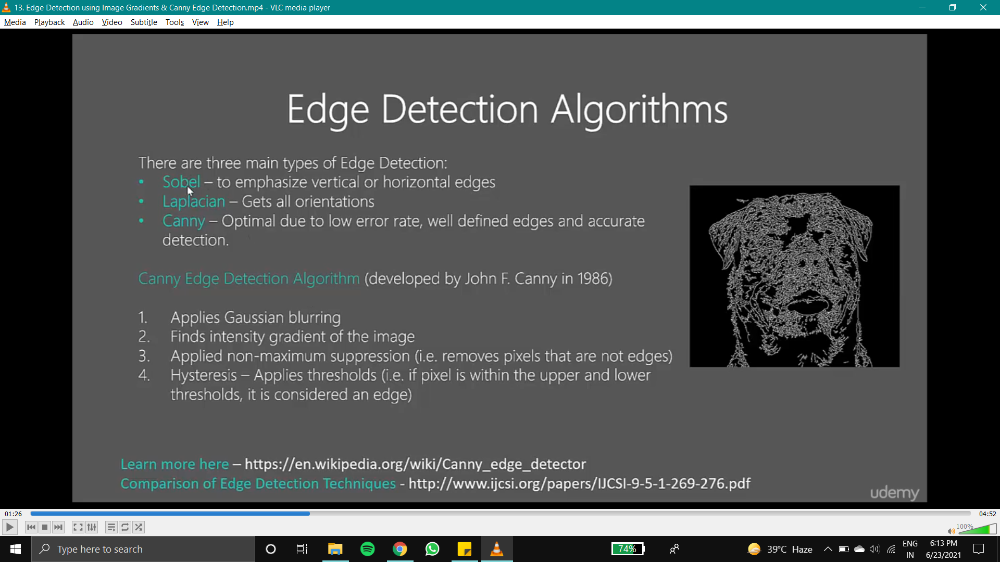

In [ ]:
height,width = input.shape
sobel_x = cv2.Sobel(input,cv2.CV_64F,0,1,ksize = 5)
sobel_y = cv2.Sobel(input,cv2.CV_64F,1,0,ksize = 5)

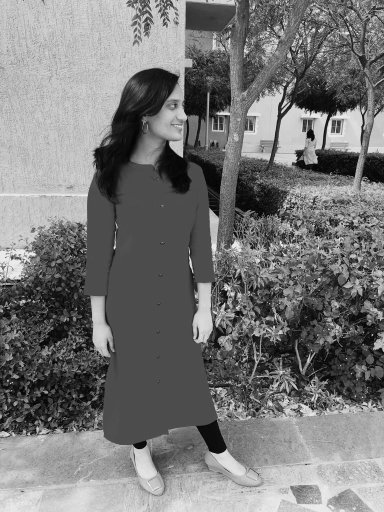

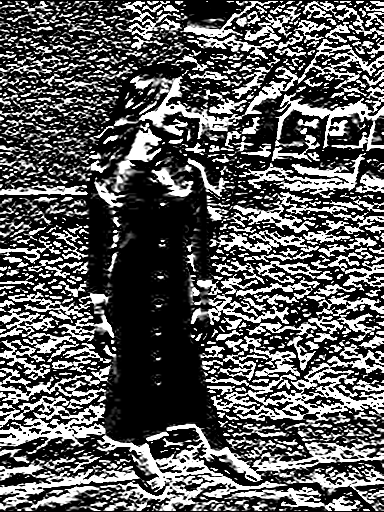

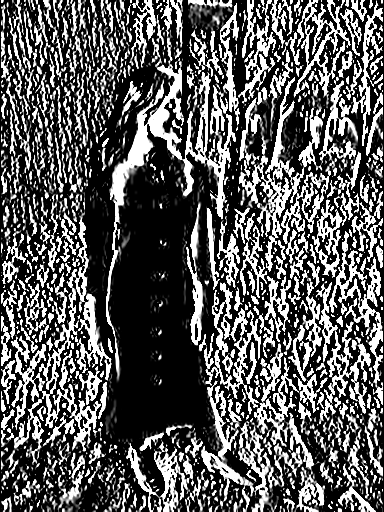

In [ ]:
cv2_imshow(input)
cv2_imshow(sobel_x)
cv2_imshow(sobel_y)


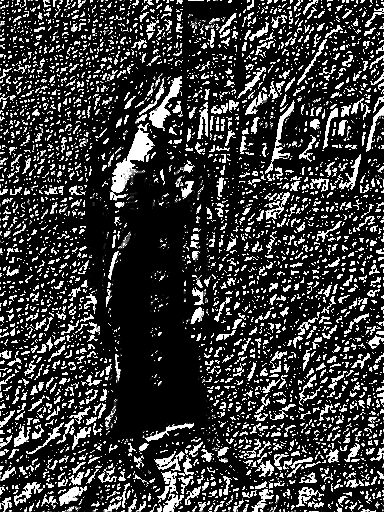

In [ ]:
sobel_or = cv2.bitwise_or(sobel_x,sobel_y)
cv2_imshow(sobel_or)

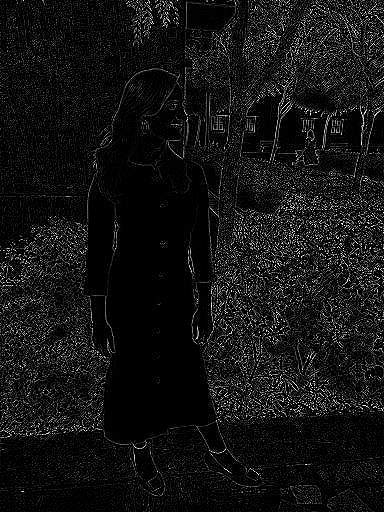

In [ ]:
laplacian = cv2.Laplacian(input,cv2.CV_64F)
cv2_imshow(laplacian)

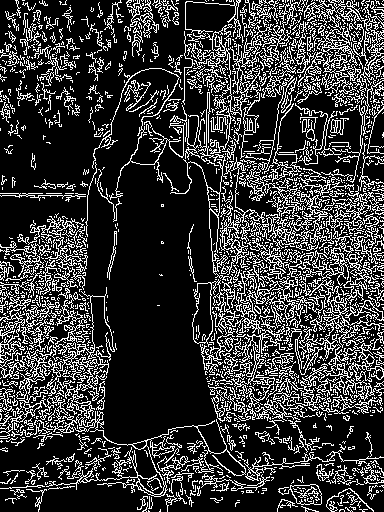

In [ ]:
canny = cv2.Canny(input,50,120)
cv2_imshow(canny)

## Obtaining the perspective of Non-Affine Transforms

In [ ]:
input = cv2.imread('/content/download.jpg')

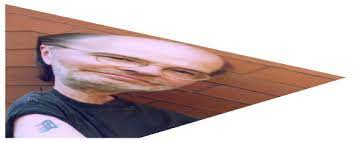

In [ ]:
cv2_imshow(input)

In [ ]:
points_a = np.float32([[20,5], [70,25], [85,100], [30,80]])
points_b = np.float32([[0,0], [40,0],[0,94],[20,54]])
M = cv2.getPerspectiveTransform(points_a, points_b)
warped = cv2.warpPerspective(input, M, (20,94))
cv2_imshow(warped)